# Computer Vision Grab Stanford Cars 

the method used is [Mixup](https://arxiv.org/abs/1710.09412)  to improve accuracy


### TL;DR
- The highest test set accuracy of **89.4%** was found with Beta=0.4, the default paramter for fastai's Mixup and the recommendated value from the original paper.
- To achieve this I found that it was critical to train a final round **without mixup** in order to fully realise Mixup's potential. Test set accuracy after Stage 4 (no  non-mixup training) was around **87%** for both Beta=0.4 and Beta=0.3. After the additional non-mixup training this accuracy **jumped to 89%** This was not noted in the Mixup paper or in Fastai's documentation.

### Constraint

**Beta=0.4**
- Test set accuracy was **89.4%**, up from my previous best (88.09%)
- Top5 Accuracy was **98.02%** 
- This result was achieved in **73 epochs** using ResNET152, fastai's implementation of the 1-cycle policy and **Mixup** data augmentation

**Beta=0.3**
- I also trialled Beta=0.3 as an exploration, which led to a slight decrease in accuracy compared to Beta=0.4, but was still higher than my previous best.
- Test set accuracy of **89.12%** and a Top5 Accuracy of **98.03%** was achieved
- This result was achieved in **XXX epochs** using ResNET152, fastai's implementation of the 1-cycle policy and **Mixup** data augmentation

### Training Data
All stages of training used the 1cycle Policy. Training this model consisted of:

  1. Training the final layer
  2. Unfreezing and training the entire model using differential learning rates
  3. Resizing the images from 224 to 299 and training the final layer again
  4. Unfreezing and training the entire model again using differential learning rates
  5. Loading a new learner **without mixup** and training the the unfrozen model again again using differential learning rates

### Mixup
This was an experiment with a simple but effective data augmentation technique called Mixup ([Zhang, 2018](https://arxiv.org/abs/1710.09412)) which acts as a strong regulariser. In the training run Mixup blends two training samples and asks the model to predict which **two** samples are present and in what proportion. Interestingly they showed that this approach works not only for Image models, but also Speech, Tabular and GAN models. They also found that Mixup made models more resilient to corrupt data.

#### The fast.ai explanation
Sebastian Gugger from [fast.ai](https://www.fast.ai) has a great explanation [here](https://forums.fast.ai/t/mixup-data-augmentation/22764). Below is an extract:

"*As the name kind of suggests, the authors of the mixup article propose to train the model on a mix of the pictures of the training set. Let’s say we’re on CIFAR10 for instance, then instead of feeding the model the raw images, we take two (which could be in the same class or not) and do a linear combination of them. In terms of tensor it’s*:

`new_image = t * image1 + (1-t) * image2`

*where t is a float between 0 and 1. Then the target we assign to that image is the same combination of the original targets*:

`new_target = t * target1 + (1-t) * target2` "

#### Beta Distribution
How strongly to weight each image depends on `t`, which is drawn from a [Beta distribution](https://stats.stackexchange.com/questions/47771/what-is-the-intuition-behind-beta-distribution). We control the shape of this distribution (and so the probability of what value of `t` is selected) by modifying the parameter `alpha`, which is set at `0.4` by default in the fastai implementation. The original paper finds that "*α ∈ [0.1, 0.4] leads to improved performance over ERM, whereas for large α, mixup leads to underfitting*". An example of the Beta distribution can be seen below, modifying `alpha` will change the distribution. 


Beta Distribution with alpha = 0.4


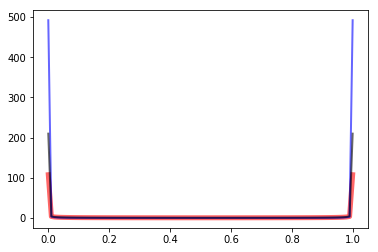

In [6]:
# Modified from the scipy docs - https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.beta.html
from scipy.stats import beta
import matplotlib.pyplot as plt

alpha = 0.4
print('Beta Distribution with alpha = {}'.format(alpha))

fig, ax = plt.subplots(1, 1)
a, b = alpha, alpha

#Display the probability density function (pdf):
x = np.linspace(beta.ppf(0.01, a, b),
                 beta.ppf(0.99, a, b), 100)

ax.plot(x, beta.pdf(x, a, b),
        'r-', lw=5, alpha=0.6, label='beta pdf')
c = 0.1
ax.plot(x, beta.pdf(x, c, c),
        'r-', lw=2, alpha=0.6, label='beta pdf', color='blue')
d = 0.3
ax.plot(x, beta.pdf(x, d, d),
        'r-', lw=2, alpha=0.6, label='beta pdf', color='black')

#plt.legend()
plt.show()

##### Max Learning Rate Drop
I have been using fastai's `fit_one_cycle` method for this series and one thing I noticed is that while using Mixup, the max learning rate (`max_lr`) passed to this method generally needs to be an order of magnitude smaller that in equivalent training runs without Mixup. For example, by only adding Mixup the best learning rate I found went from 1e-2 to 1e-3

In [1]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

import pandas as pd
from pathlib import Path
import json
from PIL import ImageDraw, ImageFont
from matplotlib import patches, patheffects
import matplotlib.pyplot as plt

import scipy.io as sio

In [2]:
from fastai import *
from fastai.vision import *
from fastai.utils.mem import *

In [3]:
from helper_functions import compare_most_confused, compare_top_losses

##### Recovery GPU memory if there is an OOM error

In [5]:
# import pynvml, torch, gc

# pynvml.nvmlInit()
# id = torch.cuda.current_device()
# def mem_free():
#     gc.collect()
#     torch.cuda.empty_cache()
#     handle = pynvml.nvmlDeviceGetHandleByIndex(id)
#     info = pynvml.nvmlDeviceGetMemoryInfo(handle)
#     return int( info.free / 2**20 )

# def mem_report(): print(f"free mem={mem_free()}")

# def mem_allocate_mbs(n, fatal=False): 
#     " allocate n MBs, return the var holding it on success, None on failure "
#     if n < 6: return None # don't try to allocate less than 6MB
#     try:
#         d = int(2**9*n**0.5)
#         return torch.ones((d, d)).cuda().contiguous()
#     except Exception as e:
#         if not fatal: return None
#         raise e
        
# def leave_free_mbs(n):
#     " consume whatever memory is needed so that n MBs are left free "
#     avail = mem_free()
#     assert avail > n, f"already have less available mem than desired {n}MBs"
#     consume = avail - n
#     print(f"consuming {consume}MB to bring free mem to {n}MBs")
#     return mem_allocate_mbs(consume, fatal=True)

# buf = leave_free_mbs(1000)

consuming 7109MB to bring free mem to 1000MBs


In [5]:
# https://github.com/fastai/fastai_docs/blob/master/dev_nb/mem_leaks/OOM_on_fit_recover.ipynb
# Run this cell, after the OOM cell

mem_report()
del buf # that was just the buffer to make the test reliable

# Now you can get all of the GPU memory back
mem_report()

## Getting the Data

In [4]:
path = 'data/stanford-cars/'

In [5]:
labels_df = pd.read_csv('labels_df.csv')
labels_df.head(3)

,filename,bbox_x1,bbox_y1,bbox_x2,bbox_y2,class_id,class_name,is_test,filename_cropped,bbox_h,bbox_w
0,00001.jpg,39,116,569,375,14,Audi TTS Coupe 2012,0,cropped_00001.jpg,260,531
1,00002.jpg,36,116,868,587,3,Acura TL Sedan 2012,0,cropped_00002.jpg,472,833
2,00003.jpg,85,109,601,381,91,Dodge Dakota Club Cab 2007,0,cropped_00003.jpg,273,517


Lets look closer at the data, how many class_ids do we have? Does it match the number of class names?

## Data Loading
Used the standard fastai image transforms and held out 20% of the training data for validation.

In [6]:
def get_data():
    SZ = 224
    SEED = 42
    LABEL = 'class_name'

    car_tfms = get_transforms()

    trn_labels_df = labels_df.loc[labels_df['is_test']==0, ['filename', 'class_name', 'class_id']].copy()

    src = (ImageItemList.from_df(trn_labels_df, path, folder='train', cols='filename')
                        .random_split_by_pct(valid_pct=0.2, seed=SEED)
                        .label_from_df(cols=LABEL))

    data = (src.transform(car_tfms, size=SZ)
                .databunch()
                .normalize(imagenet_stats))
    
    # Get test data
    TEST_SZ = 299
    src_test = (ImageItemList.from_df(labels_df, path, folder='merged', cols='filename')
           # the 'is_test' column has values of 1 for the test set
           .split_from_df(col='is_test')
           .label_from_df(cols=LABEL))

    data_test = (src_test.transform(car_tfms, size=TEST_SZ)
                .databunch()
                .normalize(imagenet_stats))
    
    return data, data_test, src, src_test, car_tfms

data, data_test, src, src_test, car_tfms = get_data()

Having a look at the images in our datablock you can see result of the image transforms:

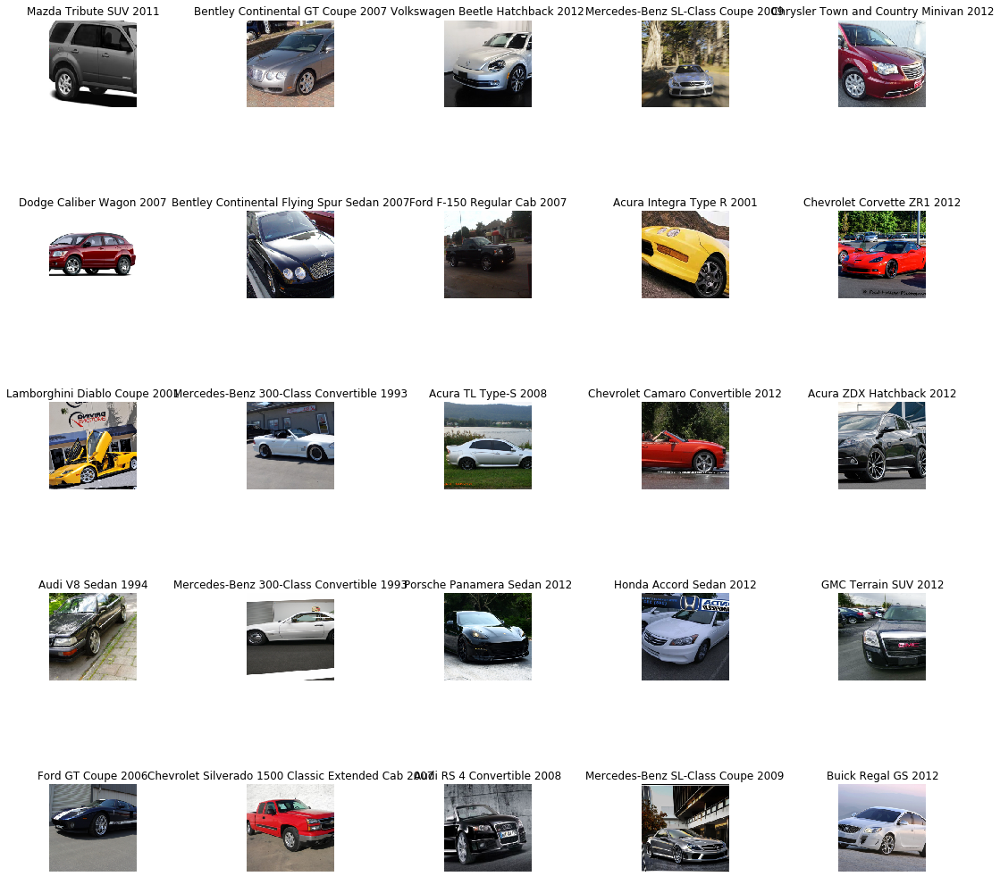

In [41]:
data.show_batch(rows=5, figsize=(15,15))

## Get The Training

In [8]:
arch = models.resnet152

Because we are using such a large model, and images of 224, I had to start with a batch size of 32 to avoid out of memory errors

In [9]:
data.batch_size = 32
data.batch_size

32

Use fastai's v1 `create_cnn` function to create a standard convolution NN learner with **Mixup**

In [13]:
learn = create_cnn(data, arch, metrics=[accuracy]).mixup()

### Stage-1

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


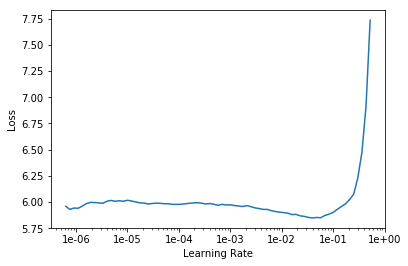

In [11]:
learn.lr_find()
learn.recorder.plot()

I found that 32 epochs was a good place to stop as the model started to overfit while the accuracy didn't improve further. Without mixup this step took 14 epochs, which demonstrates how strong a regulariser is.

In [10]:
lr = 1e-3

learn.fit_one_cycle(32, max_lr = lr)

learn.save('4_stage-1-rn152-mixup_1e-3_32e')

epoch,train_loss,valid_loss,accuracy
1,5.740887,5.186085,0.017813
2,5.398330,4.666044,0.076167
3,4.895816,4.007923,0.157862
4,4.420310,3.378050,0.287469
5,4.025768,2.772918,0.404791
6,3.584695,2.244148,0.497543
7,3.293093,1.856167,0.591523
8,3.063169,1.648276,0.621007
9,2.975293,1.541777,0.655405
10,2.824018,1.321661,0.693489


### Stage-2

In [10]:
# learn.load('4_stage-1-rn152-mixup_1e-3_32e')
# print('model loaded')

model loaded


In [11]:
learn.unfreeze()

In [13]:
learn.data.batch_size = 16
learn.data.batch_size

16

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


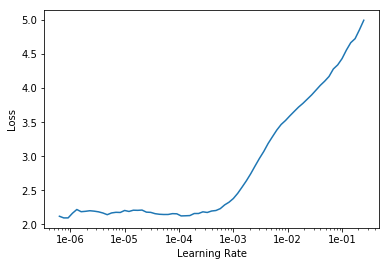

In [14]:
learn.lr_find()
learn.recorder.plot()

In [21]:
#learn = create_cnn(data, arch, metrics=[accuracy]).mixup()
# learn.load('4_stage-1-rn152-mixup_1e-3_32e')
# learn.unfreeze()
# learn.data.batch_size = 16

lr = 1e-4
lrs = np.array([lr/100,lr/10,lr])

learn.fit_one_cycle(26, lrs)

learn.save('4_stage-2-rn152-mixup_1e-4_100_26e')

epoch,train_loss,valid_loss,accuracy
1,2.007949,0.852764,0.823710
2,2.040276,0.860617,0.822482
3,2.008536,0.814551,0.827396
4,2.108292,0.836794,0.824939
5,2.033477,0.822698,0.823096
6,1.996007,0.811527,0.829853
7,2.090812,0.814230,0.836609
8,2.004771,0.814650,0.829238
9,1.995054,0.780973,0.839681
10,1.989422,0.780061,0.842752


### Stage-3

##### Load winning Stage-2 model

In [12]:
learn.load('4_stage-2-rn152-mixup_1e-4_100_26e')
print('loaded')

loaded


Resize the images

In [13]:
SZ = 299
SEED = 42
LABEL = 'class_name'

data = (src.transform(car_tfms, size=SZ)
            .databunch()
            .normalize(imagenet_stats))

data.batch_size = 16

In [14]:
learn.data = data

In [15]:
learn.freeze()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


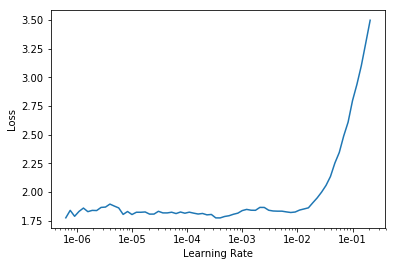

In [16]:
learn.lr_find()
learn.recorder.plot()

In [23]:
#learn = create_cnn(data, arch, metrics=[accuracy]).mixup()
#learn.load('4_stage-2-rn152-mixup_1e-4_100_26e')

lr = 1e-4

learn.fit_one_cycle(5, lr)

learn.save('4_stage-3-rn152-mixup_1e-4_5e')

epoch,train_loss,valid_loss,accuracy
1,1.899726,0.717044,0.867322
2,1.872385,0.681669,0.874693
3,1.789886,0.674916,0.870393
4,1.824129,0.678637,0.874079
5,1.787626,0.671834,0.872850


### Stage-4

#### Load the best performing model

In [10]:
SZ = 299
SEED = 42
LABEL = 'class_name'

data = (src.transform(car_tfms, size=SZ)
            .databunch()
            .normalize(imagenet_stats))

data.batch_size = 16

In [11]:
learn.load('4_stage-3-rn152-mixup_1e-4_5e')
print('loaded')

learn.data = data

loaded


In [12]:
learn.unfreeze()

In [17]:
learn.data.batch_size = 16

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


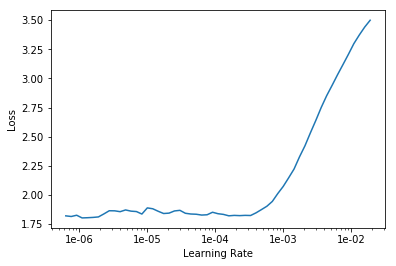

In [18]:
learn.lr_find()
learn.recorder.plot()

In [13]:
learn.load('4_stage-3-rn152-mixup_1e-4_5e')
learn.data = data
learn.data.batch_size = 12

learn.unfreeze()

lr = 1e-5
lrs = np.array([lr/100,lr/10,lr])

learn.fit_one_cycle(5, lrs)

learn.save('4_stage-4-rn152-mixup_1e-5_100_5e')

epoch,train_loss,valid_loss,accuracy
1,1.885148,0.678209,0.871007
2,1.882551,0.670267,0.875307
3,1.805535,0.663045,0.871622
4,1.856897,0.657965,0.875307
5,1.785076,0.659987,0.874079


### Stage 5 - Train with no mixup

In [11]:
SZ = 299
SEED = 42
LABEL = 'class_name'

data = (src.transform(car_tfms, size=SZ)
            .databunch()
            .normalize(imagenet_stats))

learn = create_cnn(data, arch, metrics=[accuracy])
learn.load('4_stage-4-rn152-mixup_1e-5_100_5e')

learn.data.batch_size = 12
learn.unfreeze() 

lr = 3e-5
lrs = np.array([lr/100,lr/10,lr])

learn.fit_one_cycle(5, lrs)

learn.save('4_stage-5-rn152-mixup0.4_3e-5_100_5e')
print('saved')

epoch,train_loss,valid_loss,accuracy
1,0.411612,0.619849,0.877764
2,0.396302,0.587045,0.882064
3,0.334409,0.551237,0.882678
4,0.314477,0.541578,0.882678
5,0.297567,0.550202,0.878378


saved


# Test The Data

#### Load the winning model

In [10]:
learn.load('4_stage-4-rn152-mixup_1e-5_100_5e')
print('loaded')

loaded


In [9]:
SZ = 299
SEED = 42
LABEL = 'class_name'

data = (src.transform(car_tfms, size=SZ)
            .databunch()
            .normalize(imagenet_stats))

learn = create_cnn(data_test, arch, metrics=[accuracy])

learn.load('4_stage-5-rn152-mixup0.4_3e-5_100_5e')
print('loaded')

learn.freeze()
learn.data.batch_size = 16

test_preds, test_ys = learn.TTA()
print(f'Accuracy of stage 5 model with Beta=0.4: {accuracy(test_preds, test_ys)}%')

Accuracy of stage 5 model with Beta=0.4: 0.8940430283546448%


In [11]:
def accuracy_topk(output, target, topk=(3,)):
    """Computes the precision@k for the specified values of k"""
    maxk = max(topk)
    batch_size = target.size(0)

    _, pred = output.topk(maxk, 1, True, True)
    pred = pred.t()
    correct = pred.eq(target.view(1, -1).expand_as(pred))

    res = []
    for k in topk:
        correct_k = correct[:k].view(-1).float().sum(0, keepdim=True)
        res.append(correct_k.mul_(100.0 / batch_size))
    return res

In [12]:
accuracy_topk(test_preds, test_ys, topk=(5,))

[tensor([98.0226])]

### Where did this model go wrong?
Look at incorrect predictions in the validation set, the model is getting confused with car models that are very similar, although sometimes with different car models compared to previous test runs

In [13]:
SZ = 299
SEED = 42
LABEL = 'class_name'

data = (src.transform(car_tfms, size=SZ)
            .databunch()
            .normalize(imagenet_stats))
data.batch_size = 12

learn = create_cnn(data, arch, metrics=[accuracy])
learn.load('4_stage-5-rn152-mixup0.4_3e-5_100_5e')
learn.freeze()

In [14]:
interp = ClassificationInterpretation.from_learner(learn)

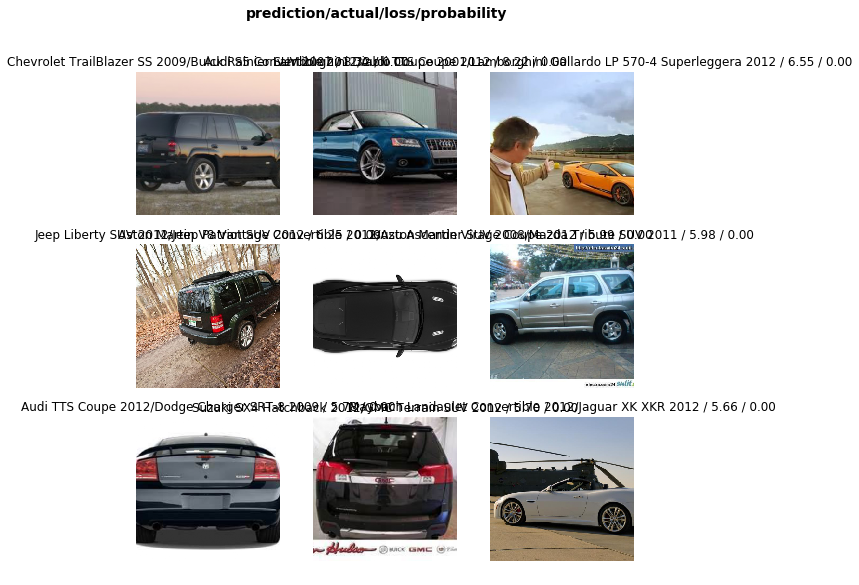

In [15]:
interp.plot_top_losses(9, figsize=(9,9))

In [16]:
most_confused = interp.most_confused()

#### What car models did the model get most confused between?

('Chevrolet Silverado 2500HD Regular Cab 2012', 'Chevrolet Silverado 1500 Regular Cab 2012', 5)


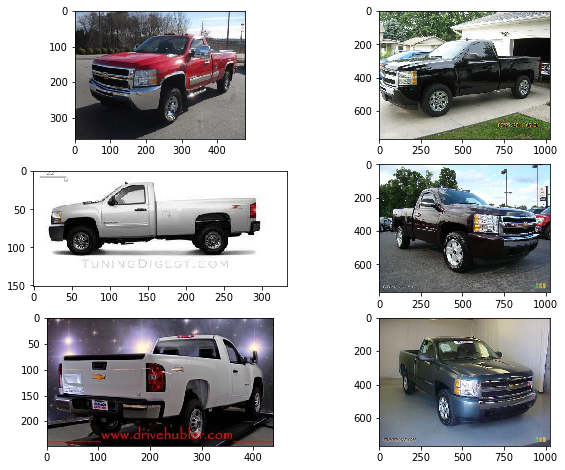

('Audi TT Hatchback 2011', 'Audi TTS Coupe 2012', 4)


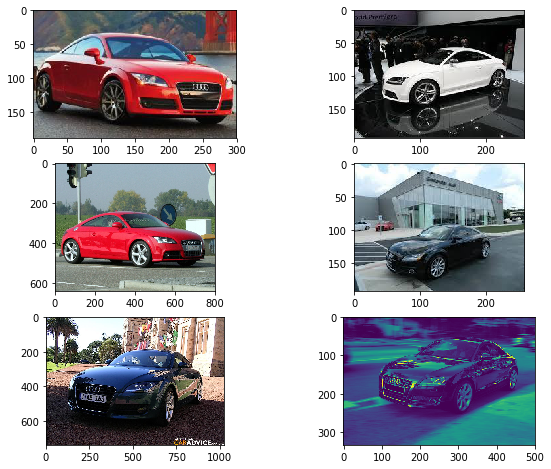

('Chevrolet Express Van 2007', 'GMC Savana Van 2012', 4)


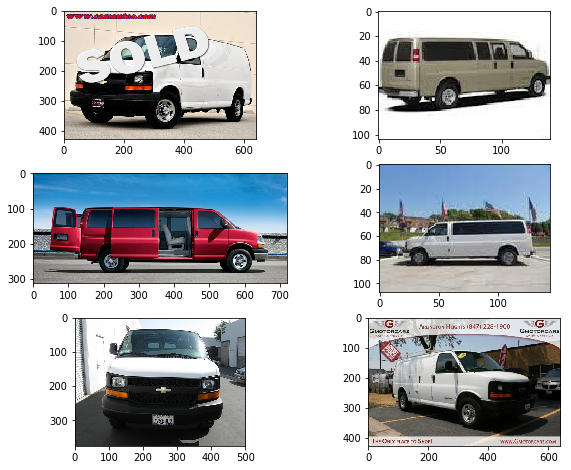

('Dodge Caliber Wagon 2012', 'Dodge Caliber Wagon 2007', 4)


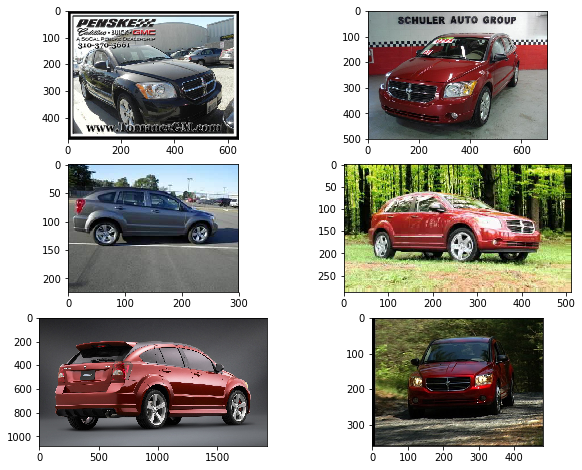

('Audi 100 Sedan 1994', 'Audi 100 Wagon 1994', 3)


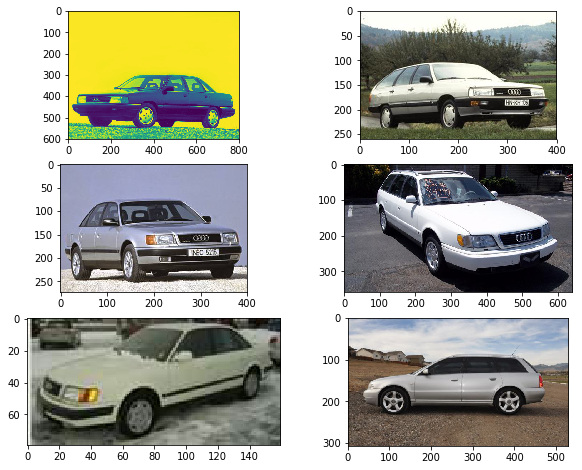

('Bentley Continental GT Coupe 2012', 'Bentley Continental GT Coupe 2007', 3)


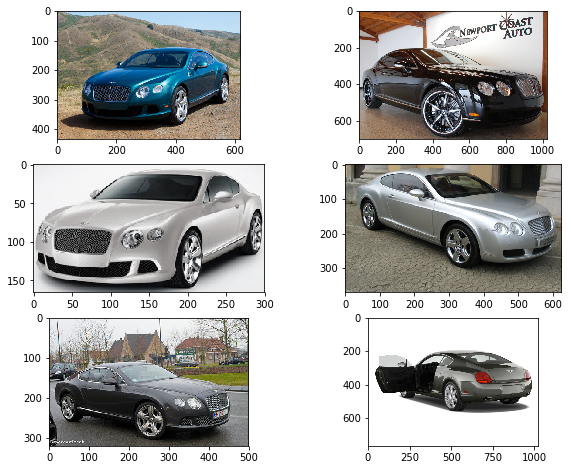

('Chevrolet Silverado 1500 Hybrid Crew Cab 2012', 'Chevrolet Silverado 1500 Extended Cab 2012', 3)


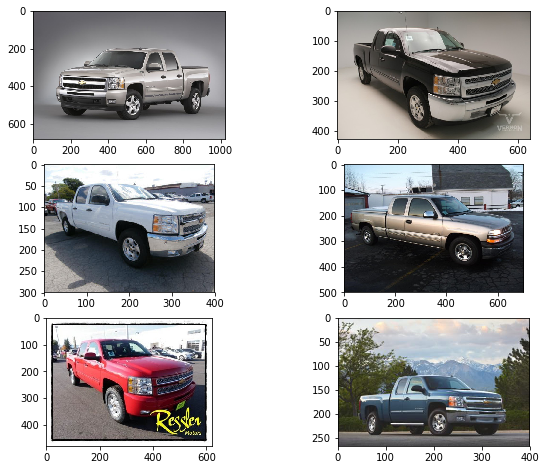

('Dodge Caliber Wagon 2007', 'Dodge Caliber Wagon 2012', 3)


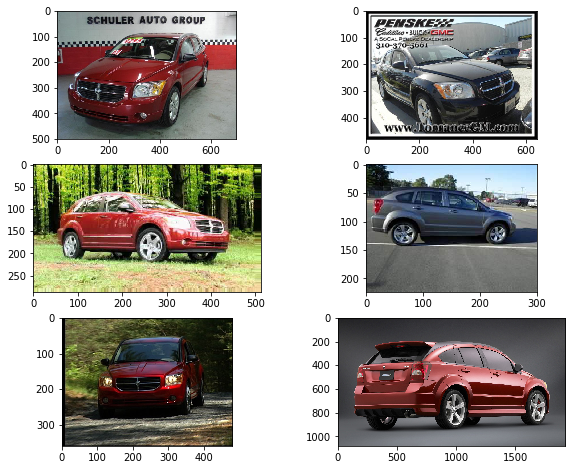

In [17]:
for i in range(0,8):
    compare_most_confused(most_confused=most_confused, path=path, labels_df=labels_df, 
                          num_imgs=3, rank=i)

#### What were the predictions with the top losses
Compare the classes with the top losses. Visualising the prediction-actual pairs can help understand where the model was getting it wrong

PREDICTION:Chevrolet TrailBlazer SS 2009, ACTUAL:Buick Rainier SUV 2007
Loss: 8.32, Probability: 0.0000


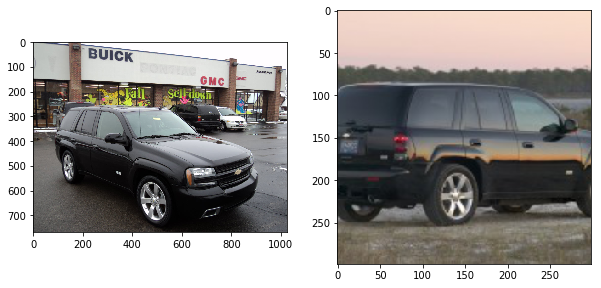

PREDICTION:Audi S5 Convertible 2012, ACTUAL:Audi TTS Coupe 2012
Loss: 8.22, Probability: 0.0002


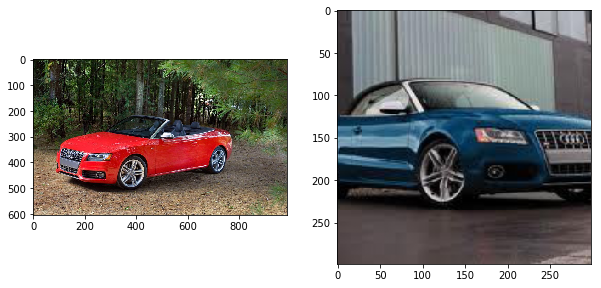

PREDICTION:Lamborghini Diablo Coupe 2001, ACTUAL:Lamborghini Gallardo LP 570-4 Superleggera 2012
Loss: 6.55, Probability: 0.0002


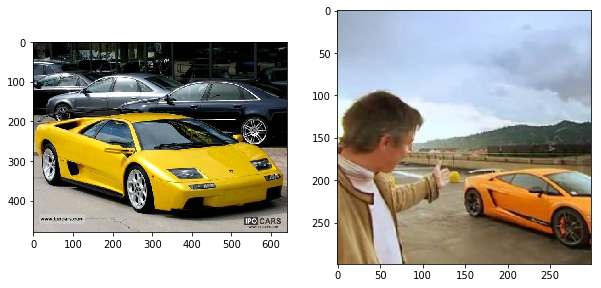

PREDICTION:Jeep Liberty SUV 2012, ACTUAL:Jeep Patriot SUV 2012
Loss: 6.25, Probability: 0.0003


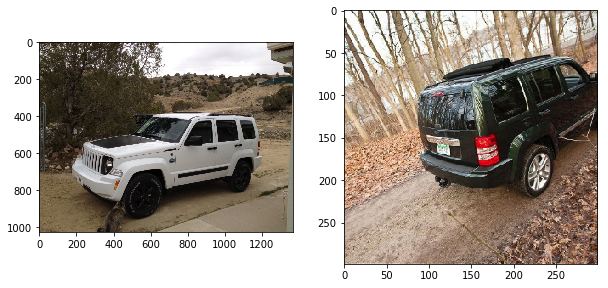

PREDICTION:Aston Martin V8 Vantage Convertible 2012, ACTUAL:Aston Martin Virage Coupe 2012
Loss: 5.99, Probability: 0.0001


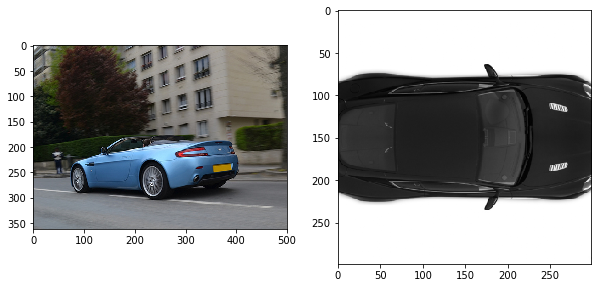

PREDICTION:Isuzu Ascender SUV 2008, ACTUAL:Mazda Tribute SUV 2011
Loss: 5.98, Probability: 0.0000


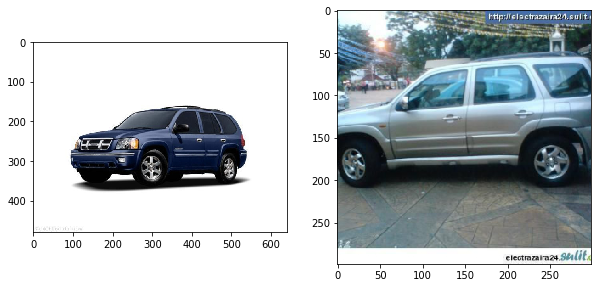

PREDICTION:Audi TTS Coupe 2012, ACTUAL:Dodge Charger SRT-8 2009
Loss: 5.78, Probability: 0.0001


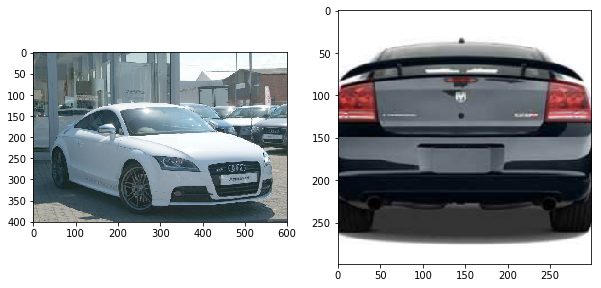

PREDICTION:Suzuki SX4 Hatchback 2012, ACTUAL:GMC Terrain SUV 2012
Loss: 5.70, Probability: 0.0001


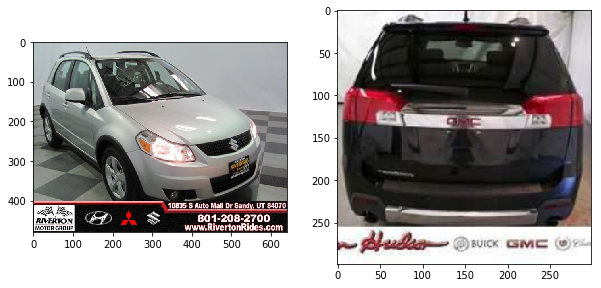

PREDICTION:Maybach Landaulet Convertible 2012, ACTUAL:Jaguar XK XKR 2012
Loss: 5.66, Probability: 0.0000


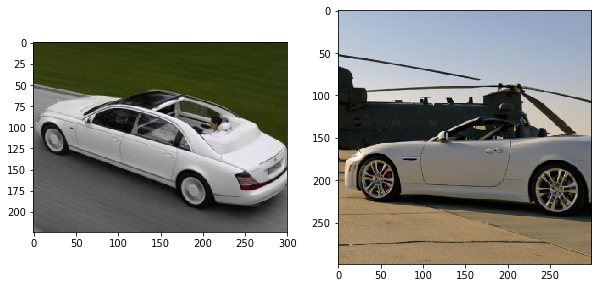

PREDICTION:Audi TT RS Coupe 2012, ACTUAL:Audi TTS Coupe 2012
Loss: 5.62, Probability: 0.0003


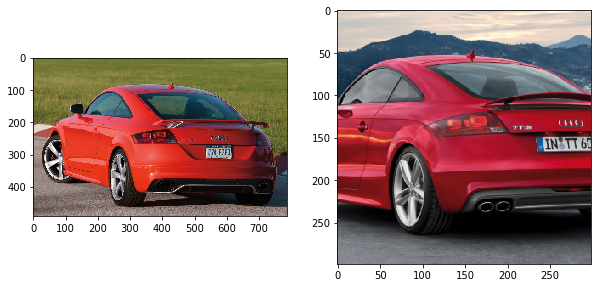

In [18]:
compare_top_losses(10, path, interp, labels_df, 1)

## Testing Mixup again with `alpha = 0.3` 
### Stage-1

In [11]:
a = 0.3
arch = models.resnet152
data, data_test, src, src_test, car_tfms = get_data()
data.batch_size = 32

learn = create_cnn(data, arch, metrics=[accuracy]).mixup(alpha=a)

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


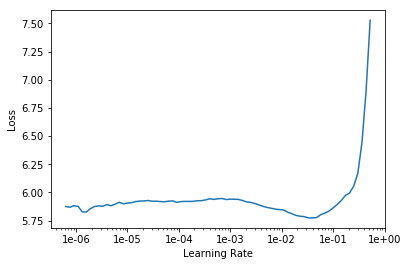

In [12]:
learn.lr_find()
learn.recorder.plot()

I found that 50 epochs was a good place to stop as the model started to overfit while the accuracy didn't improve further. Without mixup this step took 14 epochs, which demonstrates how strong a regulariser it is.

In [7]:
lr = 1e-2
learn.fit_one_cycle(50, lr)

learn.save('4_stage-1-rn152-mixup0.3_1e-2_50e')

epoch,train_loss,valid_loss,accuracy
1,4.901135,3.927044,0.170147
2,4.102328,2.924397,0.355037
3,3.487478,2.274497,0.473587
4,3.238994,1.917598,0.515971
5,3.169782,1.873282,0.515971
6,3.148148,1.839192,0.526413
7,3.217861,1.924713,0.516585
8,3.177385,1.892726,0.522113
9,3.194854,1.962685,0.520885
10,3.127545,2.093840,0.484644


### Stage-2 - Unfreeze Layers

In [10]:
# learn.load('4_stage-1-rn152-mixup0.3_1e-2_50e')
# print('model loaded')

model loaded


In [11]:
learn.unfreeze()

In [12]:
learn.data.batch_size = 16
learn.data.batch_size

16

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


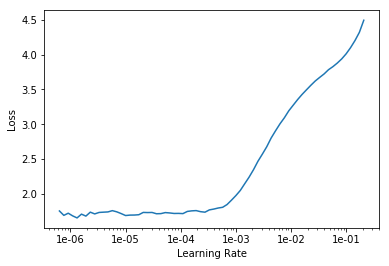

In [13]:
learn.lr_find()
learn.recorder.plot()

In [8]:
lr = 1e-3
lrs = np.array([lr/100,lr/10,lr])

learn.fit_one_cycle(10, lrs)

learn.save('4_stage-2-rn152-mixup0.3_1e-3_100_10e')

model loaded


epoch,train_loss,valid_loss,accuracy
1,1.746343,0.773512,0.834767
2,1.966231,1.056978,0.762899
3,2.118364,1.088583,0.758600
4,2.087266,0.961349,0.779484
5,1.981551,0.845803,0.806511
6,1.906436,0.771883,0.827396
7,1.835678,0.729892,0.834152
8,1.727464,0.685580,0.858108
9,1.719009,0.666832,0.862408
10,1.728300,0.664151,0.865479


### Stage 3 - Freeze & Resize

In [ ]:
SZ = 299
SEED = 42
LABEL = 'class_name'

data = (src.transform(car_tfms, size=SZ)
            .databunch()
            .normalize(imagenet_stats))

data.batch_size = 16

In [10]:
# learn.load('4_stage-2-rn152-mixup0.3_1e-3_100_10e')
# print('model loaded')

learn.freeze() 

lr = 2e-4

learn.fit_one_cycle(10, lr)

learn.save('4_stage-3-rn152-mixup0.3_2e-4_10e')

model loaded


epoch,train_loss,valid_loss,accuracy
1,1.877616,0.718438,0.852580
2,1.835784,0.660380,0.858722
3,1.779871,0.625422,0.866093
4,1.768576,0.613086,0.861179
5,1.734201,0.601546,0.864865
6,1.806524,0.592405,0.869165
7,1.826634,0.585517,0.876536
8,1.813738,0.582238,0.870393
9,1.778890,0.563662,0.875307
10,1.747421,0.573669,0.872850


### Stage 4 - Unfreeze

In [13]:
learn.load('4_stage-3-rn152-mixup0.3_2e-4_10e')
print('loaded')

loaded


In [10]:
learn.unfreeze()

In [11]:
learn.data.batch_size = 12

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


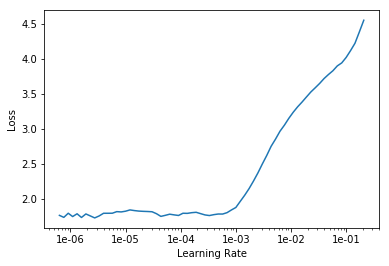

In [12]:
learn.lr_find()
learn.recorder.plot()

In [7]:
SZ = 299
SEED = 42
LABEL = 'class_name'

data = (src.transform(car_tfms, size=SZ)
            .databunch()
            .normalize(imagenet_stats))

a = 0.3
arch = models.resnet152

data.batch_size = 12
learn = []
learn = create_cnn(data, arch, metrics=[accuracy]).mixup(alpha=a)

learn.load('4_stage-3-rn152-mixup0.3_2e-4_10e')
print('model loaded')

learn.unfreeze() 

lr = 3e-5
lrs = np.array([lr/100,lr/10,lr])

learn.fit_one_cycle(10, lr)

learn.save('4_stage-4-rn152-mixup0.3_3e-5_100_10e')

model loaded


epoch,train_loss,valid_loss,accuracy
1,1.815589,0.562190,0.868550
2,1.818984,0.590172,0.867322
3,1.788585,0.643303,0.859951
4,1.833286,0.671442,0.851351
5,1.818662,0.602487,0.866093
6,1.713946,0.585350,0.874693
7,1.760619,0.550007,0.883292
8,1.729399,0.526510,0.879607
9,1.703219,0.512021,0.879607
10,1.702829,0.527987,0.876536


### Stage 5 - Remove Mixup and Fine Tune

In [ ]:
# Load a new learner, without mixup
learn = create_cnn(data, arch, metrics=[accuracy])

# Load model weights
learn.load('4_stage-4-rn152-mixup0.3_3e-5_100_10e')
print('loaded')

In [14]:
learn.unfreeze() 

lr = 3e-5
lrs = np.array([lr/100,lr/10,lr])

learn.fit_one_cycle(5, lrs)

learn.save('4_stage-5-rn152-mixup0.3_3e-5_100_5e')
print('saved')

loaded


epoch,train_loss,valid_loss,accuracy
1,0.379987,0.528289,0.880835
2,0.367566,0.513822,0.884521
3,0.348877,0.477407,0.882064
4,0.288345,0.540002,0.875307
5,0.304052,0.466102,0.880835


saved


### Test Time!

In [8]:
learn = create_cnn(data, arch, metrics=[accuracy])
learn.load('4_stage-5-rn152-mixup0.3_3e-5_100_5e')

learn.data = data_test
test_preds, test_ys = learn.TTA()
print(f'Final accuracy on the test set is: {accuracy(test_preds, test_ys)}%')

Final accuracy on the test set is: 0.8910583257675171%


In [9]:
def accuracy_topk(output, target, topk=(3,)):
    """Computes the precision@k for the specified values of k"""
    maxk = max(topk)
    batch_size = target.size(0)

    _, pred = output.topk(maxk, 1, True, True)
    pred = pred.t()
    correct = pred.eq(target.view(1, -1).expand_as(pred))

    res = []
    for k in topk:
        correct_k = correct[:k].view(-1).float().sum(0, keepdim=True)
        res.append(correct_k.mul_(100.0 / batch_size))
    return res

In [10]:
print(f'Final Top5 accuracy on the test set is: {accuracy_topk(test_preds, test_ys, topk=(5,))}')

Final Top5 accuracy on the test set is: [tensor([98.0351])]


### Where did this model go wrong?
Look at incorrect predictions in the validation set, the model is getting confused with car models that are very similar, although sometimes with different car models compared to previous test runs

In [ ]:
SZ = 299
SEED = 42
LABEL = 'class_name'

data = (src.transform(car_tfms, size=SZ)
            .databunch()
            .normalize(imagenet_stats))
data.batch_size = 12

learn = create_cnn(data, arch, metrics=[accuracy])
learn.load('4_stage-5-rn152-mixup0.3_3e-5_100_5e')
learn.freeze()

In [24]:
interp = ClassificationInterpretation.from_learner(learn)

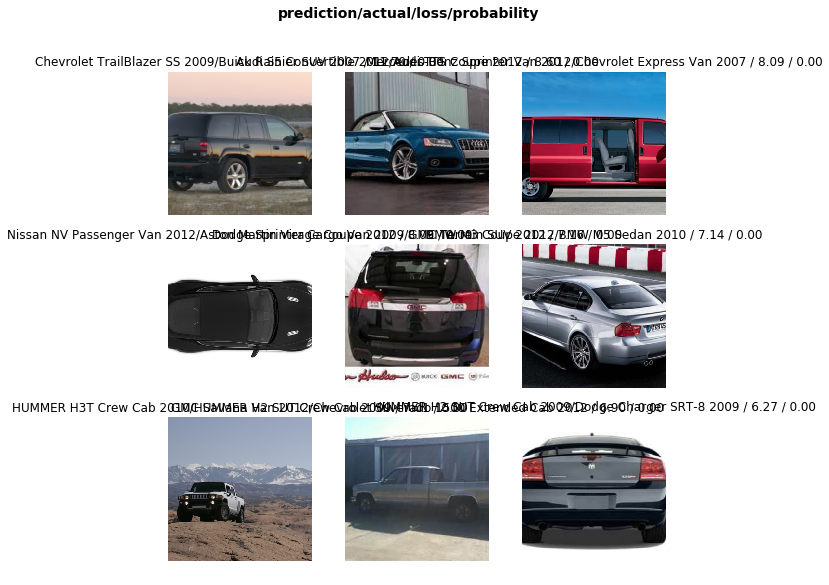

In [25]:
interp.plot_top_losses(9, figsize=(9,9))

In [26]:
most_confused = interp.most_confused()

#### What car models did the model get most confused between?

('Chevrolet Silverado 2500HD Regular Cab 2012', 'Chevrolet Silverado 1500 Regular Cab 2012', 5)


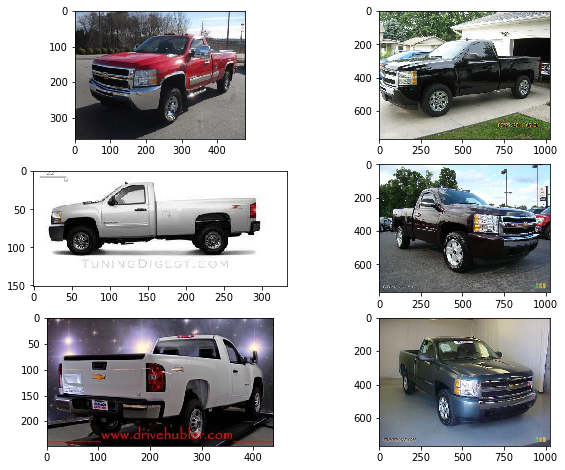

('Bentley Continental GT Coupe 2012', 'Bentley Continental GT Coupe 2007', 4)


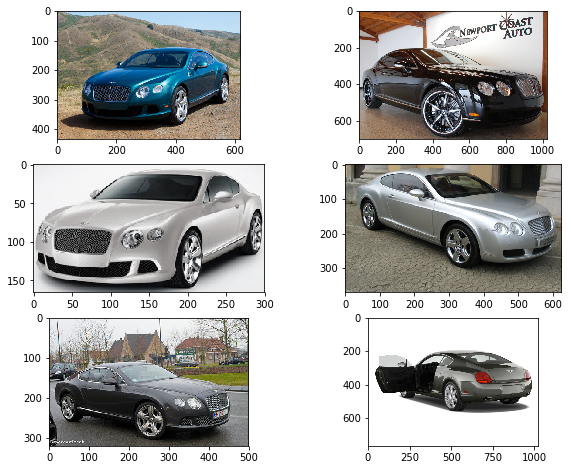

('Bugatti Veyron 16.4 Coupe 2009', 'Bugatti Veyron 16.4 Convertible 2009', 4)


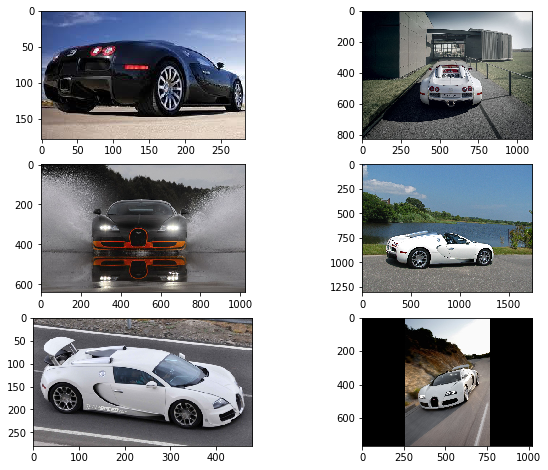

('Dodge Caliber Wagon 2007', 'Dodge Caliber Wagon 2012', 4)


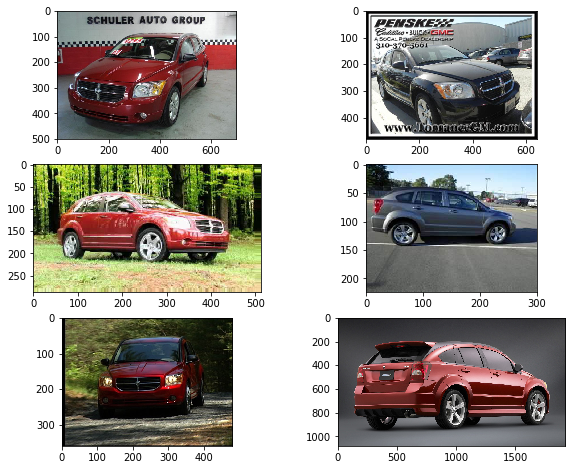

('Audi 100 Wagon 1994', 'Audi 100 Sedan 1994', 3)


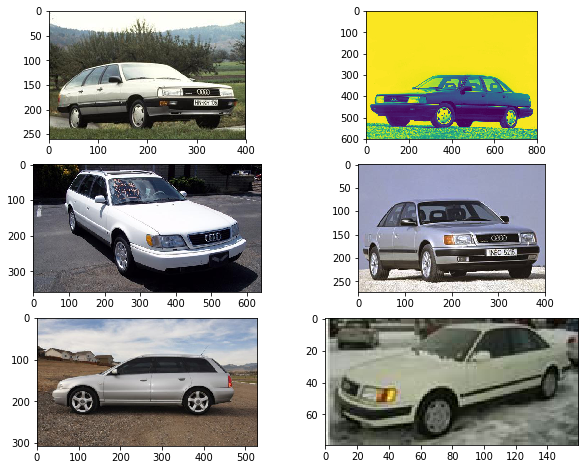

('Audi TT Hatchback 2011', 'Audi TTS Coupe 2012', 3)


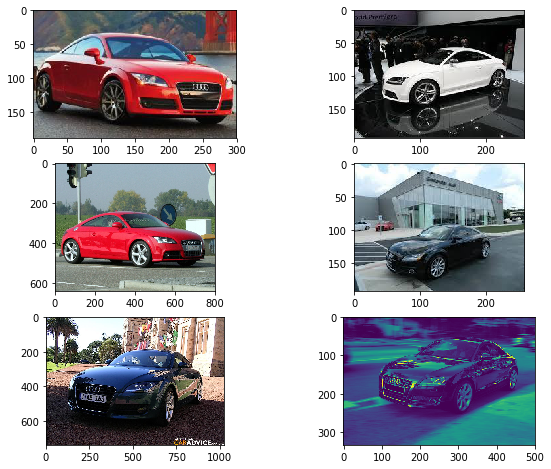

('Chevrolet Silverado 1500 Extended Cab 2012', 'Chevrolet Silverado 1500 Hybrid Crew Cab 2012', 3)


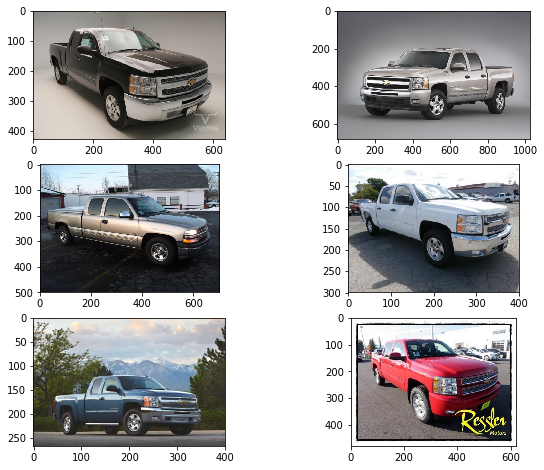

('Dodge Caliber Wagon 2012', 'Dodge Caliber Wagon 2007', 3)


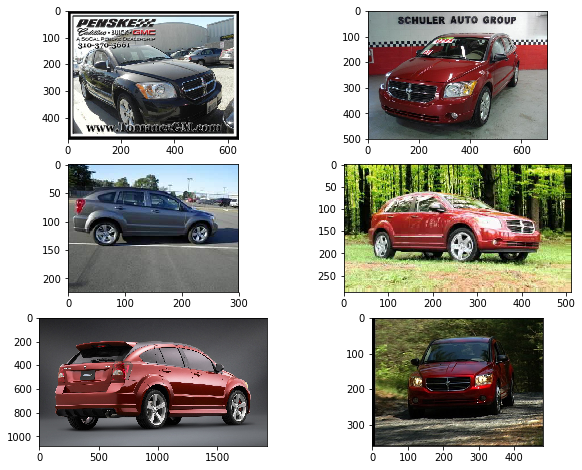

In [27]:
for i in range(0,8):
    compare_most_confused(most_confused=most_confused, path=path, labels_df=labels_df, 
                          num_imgs=3, rank=i)

Compare the classes with the top losses. Visualising the prediction-actual pairs can help understand where the model was getting it wrong

PREDICTION:Chevrolet TrailBlazer SS 2009, ACTUAL:Buick Rainier SUV 2007
Loss: 11.70, Probability: 0.0000


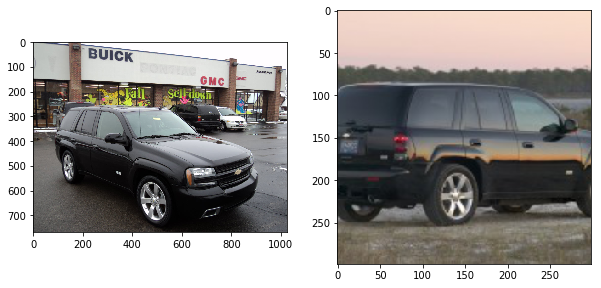

PREDICTION:Audi S5 Convertible 2012, ACTUAL:Audi TTS Coupe 2012
Loss: 8.60, Probability: 0.0000


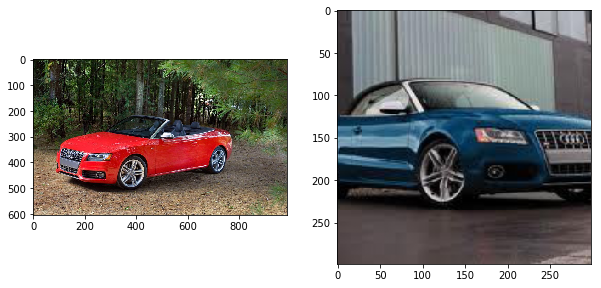

PREDICTION:Mercedes-Benz Sprinter Van 2012, ACTUAL:Chevrolet Express Van 2007
Loss: 8.09, Probability: 0.0002


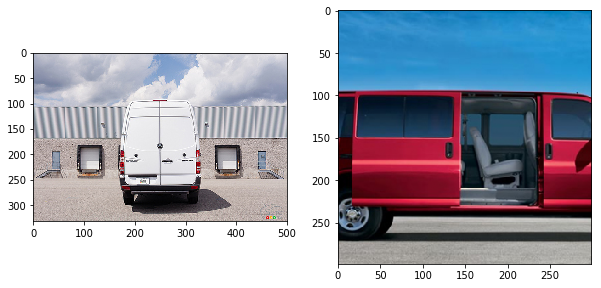

PREDICTION:Nissan NV Passenger Van 2012, ACTUAL:Aston Martin Virage Coupe 2012
Loss: 8.09, Probability: 0.0004


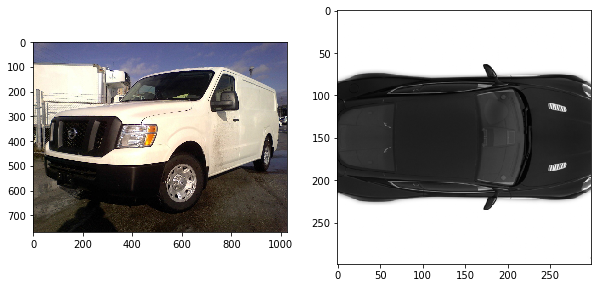

PREDICTION:Dodge Sprinter Cargo Van 2009, ACTUAL:GMC Terrain SUV 2012
Loss: 7.16, Probability: 0.0002


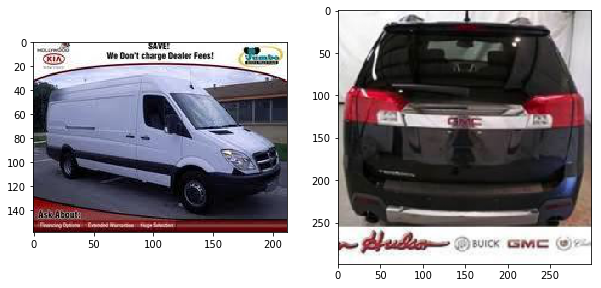

PREDICTION:BMW M3 Coupe 2012, ACTUAL:BMW M5 Sedan 2010
Loss: 7.14, Probability: 0.0145


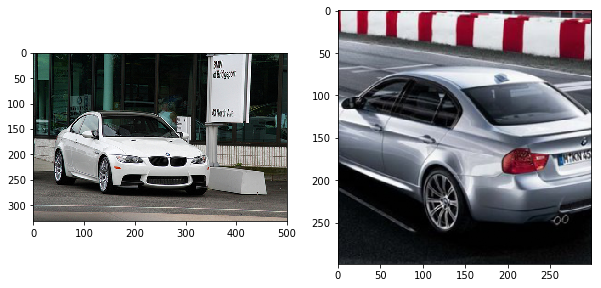

PREDICTION:HUMMER H3T Crew Cab 2010, ACTUAL:HUMMER H2 SUT Crew Cab 2009
Loss: 7.01, Probability: 0.0000


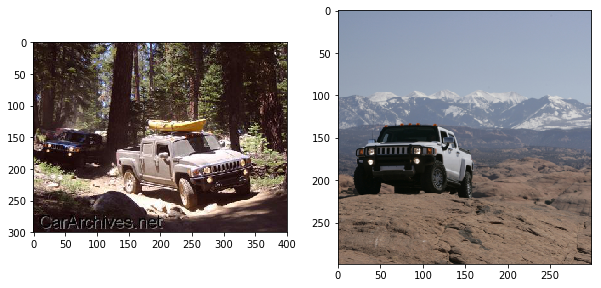

PREDICTION:GMC Savana Van 2012, ACTUAL:Chevrolet Silverado 1500 Extended Cab 2012
Loss: 6.90, Probability: 0.0001


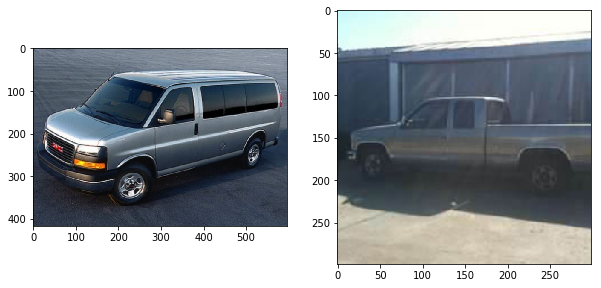

PREDICTION:HUMMER H2 SUT Crew Cab 2009, ACTUAL:Dodge Charger SRT-8 2009
Loss: 6.27, Probability: 0.0001


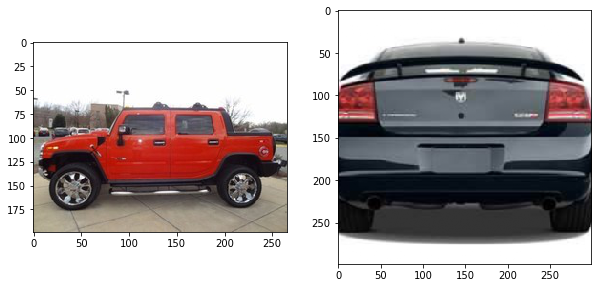

PREDICTION:Chevrolet Camaro Convertible 2012, ACTUAL:Aston Martin V8 Vantage Convertible 2012
Loss: 6.03, Probability: 0.0000


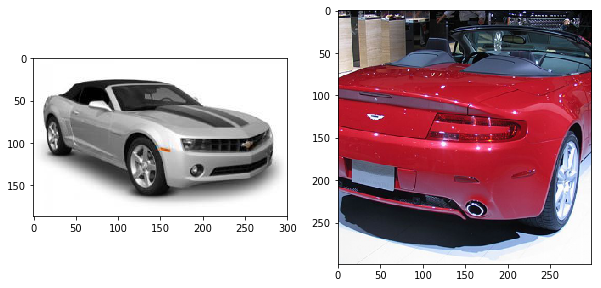

In [28]:
compare_top_losses(10, path, interp, labels_df, 1)